# Experiments for determining the optimal parameters

In [1]:
# External Imports
import numpy as np

# Internal Imports
from inpainter import *

## Comparison in terms of percentage of erased pixels
We run an experiment with a fixed relaxation parameter $\lambda=1$ and a fixed step size $\rho=1$, and vary the percentage of randomly erased pixels between $10\%$ and $100\%$. Keep in mind this will take roughly $10$ minutes to run.

Static Alpha:   0%|          | 0/30 [00:00<?, ?Value of ratio/s]

Inertial Alpha:   0%|          | 0/30 [00:00<?, ?Value of ratio/s]

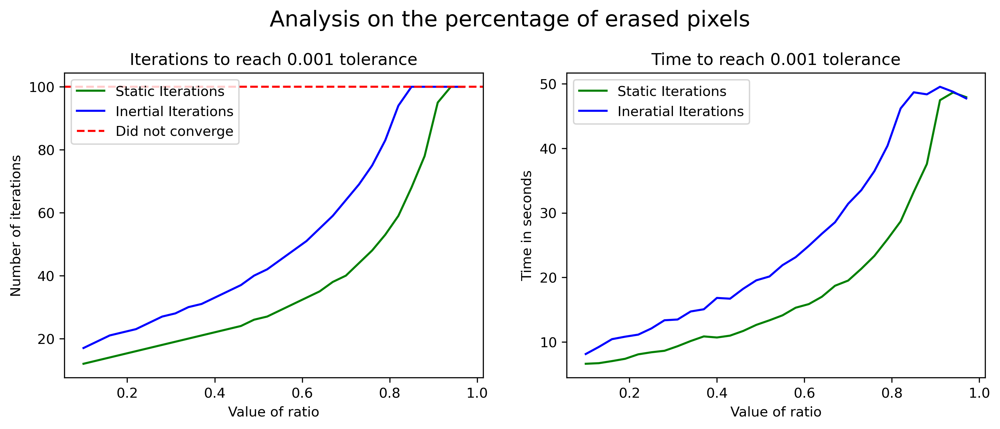

  ratio    Its Static    Time Static    Its Inertial    Time Inertial
-------  ------------  -------------  --------------  ---------------
   0.1             12             17         6.6104           8.12074
   0.13            13             19         6.70176          9.22198
   0.16            14             21         7.02466         10.4242
   0.19            15             22         7.37933         10.8078
   0.22            16             23         8.07245         11.1271
   0.25            17             25         8.3923          12.0823
   0.28            18             27         8.62418         13.3527
   0.31            19             28         9.33004         13.4706
   0.34            20             30        10.1367          14.7182
   0.37            21             31        10.8505          15.0568
   0.4             22             33        10.6827          16.8166
   0.43            23             35        10.9716          16.6982
   0.46            24         

In [2]:
Exp = ExpRatio(np.arange(0.1, 0.99, 0.03), lamb=0.5, rho=1)
Exp.run(max_iterations=100, tolerance=1e-3, title="Analysis on the percentage of erased pixels")

## Comparison in terms of the step size
We run an experiment with a fixed relaxation parameter $\lambda=1$, whilst iterating over some representative values of the step size $\rho$, for an image with $50\%$ of its pixels randomly erased. This runs in around $6$ minutes.

Static Alpha:   0%|          | 0/19 [00:00<?, ?Value of rho/s]

Inertial Alpha:   0%|          | 0/19 [00:00<?, ?Value of rho/s]

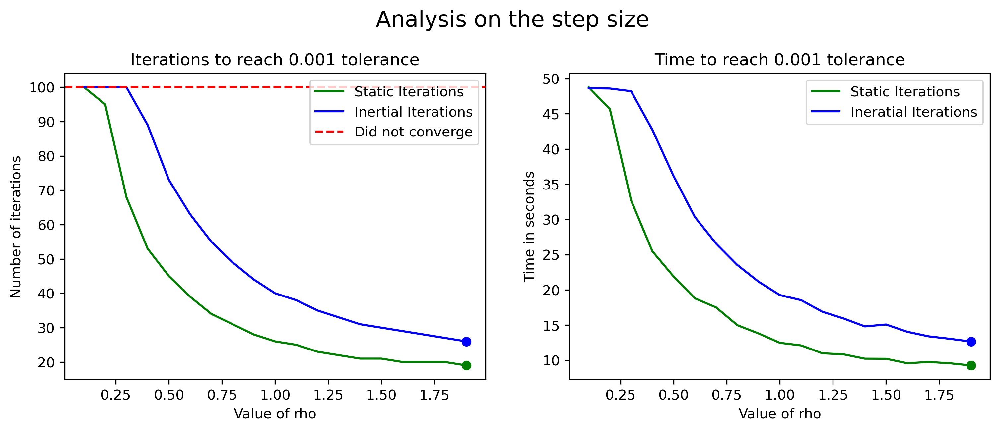

  rho    Its Static    Time Static    Its Inertial    Time Inertial
-----  ------------  -------------  --------------  ---------------
  0.1           100            100        48.7742           48.6256
  0.2            95            100        45.6568           48.5819
  0.3            68            100        32.6909           48.1991
  0.4            53             89        25.4753           42.7235
  0.5            45             73        21.8922           36.1401
  0.6            39             63        18.798            30.3475
  0.7            34             55        17.505            26.561
  0.8            31             49        14.9813           23.5281
  0.9            28             44        13.8059           21.1579
  1              26             40        12.4786           19.256
  1.1            25             38        12.1072           18.5425
  1.2            23             35        10.9937           16.8947
  1.3            22             33        10.8471 

In [3]:
Exp = ExpRho(np.arange(0.1, 2, 0.1), lamb=0.5, ratio=0.5)
Exp.run(max_iterations=100, tolerance=1e-3, title="Analysis on the step size")

## Comparison in terms of the relaxation parameter
We now run an experiment with a fixed  step size $\rho=1$, whilst iterating over some representative values of the relaxation parameter $\lambda$, for an image with $50\%$ of its pixels randomly erased. This takes roughly $3$ minutes to execute.

Static Alpha:   0%|          | 0/9 [00:00<?, ?Value of lambda/s]

Inertial Alpha:   0%|          | 0/9 [00:00<?, ?Value of lambda/s]

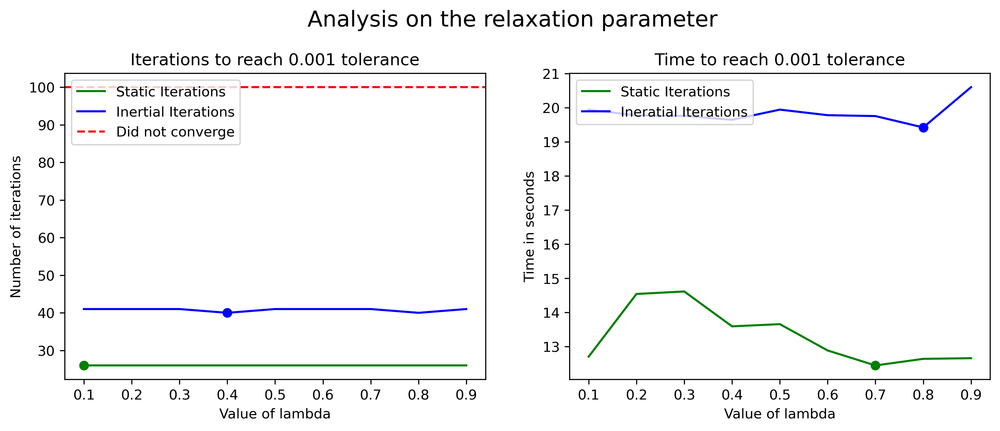

  lambda    Its Static    Time Static    Its Inertial    Time Inertial
--------  ------------  -------------  --------------  ---------------
     0.1            26             41         12.7051          19.9397
     0.2            26             41         14.5411          19.7708
     0.3            26             41         14.614           19.7553
     0.4            26             40         13.5929          19.6411
     0.5            26             41         13.6572          19.9395
     0.6            26             41         12.8865          19.7767
     0.7            26             41         12.4474          19.7506
     0.8            26             40         12.641           19.4175
     0.9            26             41         12.6603          20.5967


In [4]:
Exp = ExpLambda(np.arange(0.1, 1, 0.1), rho=1, ratio=0.5)
Exp.run(max_iterations=100, tolerance=1e-3, title="Analysis on the relaxation parameter")

## Final Result
In this final section we erase $50\%$ of the pixels randomly, select a step size of $\rho=1.6$ and a relaxation parameter of $\lambda=X$ (Yet to be determined), and observe this beautiful result. This runs in less than a minutes.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


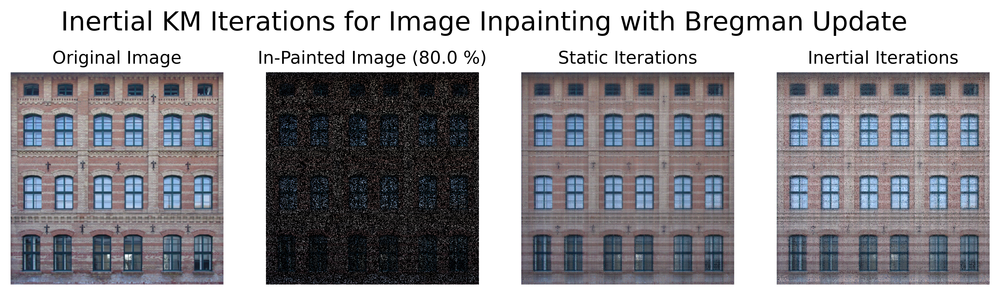

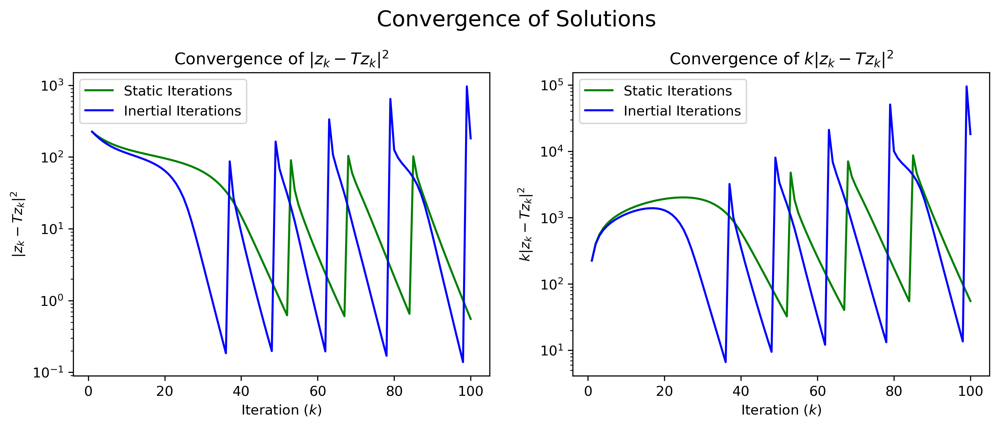

In [4]:
## Import the Image
Img = MaskedImage(image_string="Houses.jpeg", image_size=(512, 512), erase_ratio=0.8)

# Create InPainter Instance
IP = InPainter(Img, max_it=100, tol=1e-3, tol_bregman=1e0)

# # Get Static Solution
# sol_static, _, _, conv_static = IP.run(rho=1.6, lamb=0.5, alpha_static=True)

# # Get Inertial Solution
# sol_inertial, _, _, conv_inertial = IP.run(rho=1.6, lamb=0.5, alpha_static=False)

# Get Static Solution With Bregman
sol_static_breg, _, _, conv_static_breg = IP.run(rho=1.6, lamb=0.5, alpha_static=True, bregman=True)

# Get Inertial Solution with Bregman Update
sol_inertial_breg, _, _, conv_inertial_breg = IP.run(rho=1.6, lamb=0.5, alpha_static=False, bregman=True)

# # Plot Both Solutions
# Img.visualize([sol_static, "Static Iterations"],
#               [sol_inertial, "Inertial Iterations"],
#               title="Inertial KM Iterations for Image Inpainting")

# Plot Both Solutions with Bregman Update
Img.visualize([sol_static_breg, "Static Iterations"],
              [sol_inertial_breg, "Inertial Iterations"],
              title="Inertial KM Iterations for Image Inpainting with Bregman Update")

# plot_convergence(conv_static, conv_inertial)
plot_convergence(conv_static_breg, conv_inertial_breg)